# **Navigating Namma Bengaluru: Unraveling the Chaos of Bangalore Traffic**

Bangalore, India's Garden City, is well renowned for its chaotic traffic. The never-ending traffic congestion, the terrible car accidents, and what not! But among the chaos, do we notice any underlying order? Let's investigate the 'Bangalore-road-data' dataset from Kaggle to solve this puzzle.

### **Step 1: Exploring the dataset**

In [ ]:
#Let us first import all the required modules
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
#Importing the dataset
data=pd.read_csv('/content/bangalore-cas-alerts.csv')
data.head()

,deviceCode_deviceCode,deviceCode_location_latitude,deviceCode_location_longitude,deviceCode_location_wardName,deviceCode_pyld_alarmType,deviceCode_pyld_speed,deviceCode_time_recordedTime_$date
0,864504031502210,12.984595,77.744087,Kadugodi,PCW,32,2018-02-01T01:48:59.000Z
1,864504031502210,12.984595,77.744087,Kadugodi,PCW,32,2018-02-01T01:48:59.000Z
2,864504031502210,12.987233,77.741119,Garudachar Playa,FCW,41,2018-02-01T01:50:00.000Z
3,864504031502210,12.987233,77.741119,Garudachar Playa,FCW,41,2018-02-01T01:50:00.000Z
4,864504031502210,12.987503,77.740051,Hudi,Overspeed,37,2018-02-01T01:50:11.000Z


In [ ]:
data.columns

Index(['deviceCode_deviceCode', 'deviceCode_location_latitude',
       'deviceCode_location_longitude', 'deviceCode_location_wardName',
       'deviceCode_pyld_alarmType', 'deviceCode_pyld_speed',
       'deviceCode_time_recordedTime_$date'],
      dtype='object')

The data is collected by a Collision Avoidance System installed in buses, which includes information about potential collisions in various areas of Bangalore city. The key details are:<br><br>
**deviceCode:** A unique code for each CAS device in the vehicles.<br><br>
**latitude and longitude:** The location where collision warnings were generated.<br><br>
**wardName:** The area (ward) in Bangalore where the location (latitude and longitude) falls.<br><br>
**alarmType:** The type of collision alert generated, which can be Forward Collision Warning (FCW), Headway/Following Time Monitoring & Warning (HMW), Lane Departure Warning Left (LDWL), Lane Departure Warning Right (LDWR), Speed Limit Indicator (Overspeed), Pedestrian & Cyclist Collision Warning (PCW), or Urban Forward Collision Warning (FCW).<br><br>
**recordedTime:** The time when the collision alert was generated.
speed: The speed of the vehicle at the time when the collision alert was generated, measured in kilometers per hour.

Concise explanation of each collision alert type:

1. **Forward Collision Warning (FCW):** Warns the driver when the vehicle is approaching another vehicle or obstacle too quickly to avoid a potential front-end collision.

2. **Headway/Following Time Monitoring & Warning (HMW):** Monitors the distance between the vehicle and the one ahead, issuing a warning if the following distance becomes too close or insufficient.

3. **Lane Departure Warning Left (LDWL) and Lane Departure Warning Right (LDWR):** Alerts the driver when the vehicle starts to drift out of its lane without using the turn signal.

4. **Speed Limit Indicator (Overspeed):** Detects the vehicle's speed and warns the driver if it exceeds the posted speed limit on the road.

5. **Pedestrian & Cyclist Collision Warning (PCW):** Specifically detects pedestrians or cyclists in the vehicle's path, providing a warning to the driver to exercise caution.

6. **Urban Forward Collision Warning (FCW):** A variation of the Forward Collision Warning, designed for urban driving scenarios to alert the driver of potential front-end collisions within city environments.

## **Step 2: Data Preprocessing**

Before we make explore the data and analyse some aspects, let us first make some modifications to it and improve its quality.

In [ ]:
data.dtypes

deviceCode_deviceCode                   int64
deviceCode_location_latitude          float64
deviceCode_location_longitude         float64
deviceCode_location_wardName           object
deviceCode_pyld_alarmType              object
deviceCode_pyld_speed                   int64
deviceCode_time_recordedTime_$date     object
dtype: object

In [ ]:
#Let us split the 'deviceCode_time_recordedTime_$date' column into two separate columns:
data['deviceCode_time_recordedTime_$date']

0         2018-02-01T01:48:59.000Z
1         2018-02-01T01:48:59.000Z
2         2018-02-01T01:50:00.000Z
3         2018-02-01T01:50:00.000Z
4         2018-02-01T01:50:11.000Z
                    ...           
207612    2018-07-30T10:56:12.000Z
207613    2018-07-30T11:07:19.000Z
207614    2018-07-30T11:14:02.000Z
207615    2018-07-30T11:16:24.000Z
207616    2018-07-30T11:25:51.000Z
Name: deviceCode_time_recordedTime_$date, Length: 207617, dtype: object

In [ ]:
data['deviceCode_time_recordedTime_$date']=pd.to_datetime(data['deviceCode_time_recordedTime_$date'])
data['Date']=data['deviceCode_time_recordedTime_$date'].dt.date
data['Time']=data['deviceCode_time_recordedTime_$date'].dt.time

In [ ]:
df=data.drop(columns=['deviceCode_time_recordedTime_$date'])

In [ ]:
df.head()

,deviceCode_deviceCode,deviceCode_location_latitude,deviceCode_location_longitude,deviceCode_location_wardName,deviceCode_pyld_alarmType,deviceCode_pyld_speed,Date,Time
0,864504031502210,12.984595,77.744087,Kadugodi,PCW,32,2018-02-01,01:48:59
1,864504031502210,12.984595,77.744087,Kadugodi,PCW,32,2018-02-01,01:48:59
2,864504031502210,12.987233,77.741119,Garudachar Playa,FCW,41,2018-02-01,01:50:00
3,864504031502210,12.987233,77.741119,Garudachar Playa,FCW,41,2018-02-01,01:50:00
4,864504031502210,12.987503,77.740051,Hudi,Overspeed,37,2018-02-01,01:50:11


In [ ]:
#Checking for null values:
df.isnull().sum() # we observe that there are no null values.

deviceCode_deviceCode            0
deviceCode_location_latitude     0
deviceCode_location_longitude    0
deviceCode_location_wardName     0
deviceCode_pyld_alarmType        0
deviceCode_pyld_speed            0
Date                             0
Time                             0
dtype: int64

In [ ]:
#Checking for duplicates:
df.duplicated().sum()

55341

In [ ]:
#number of rows and columns in the original datatset:
df.shape

(207617, 8)

We observe that there are 55341 duplicate rows. Let us drop these rows before we proceed...

In [ ]:
df.drop_duplicates(inplace=True)

In [ ]:
df.shape #All the duplicate rows have been removed

(152276, 8)

In [ ]:
#Let us simplify the column names
df.columns=df.columns.str.replace('deviceCode_','')

In [ ]:
df.columns=df.columns.str.title()

In [ ]:
df.columns

Index(['Devicecode', 'Location_Latitude', 'Location_Longitude',
       'Location_Wardname', 'Pyld_Alarmtype', 'Pyld_Speed', 'Date', 'Time'],
      dtype='object')

### **Examining the dataset**

In [ ]:
df.dtypes

Devicecode              int64
Location_Latitude     float64
Location_Longitude    float64
Location_Wardname      object
Pyld_Alarmtype         object
Pyld_Speed              int64
Date                   object
Time                   object
dtype: object

In [ ]:
df.Location_Wardname.unique() #The dataset covers the records of the below areas

array(['Kadugodi', 'Garudachar Playa', 'Hudi', 'Other', 'Devasandra',
       'Hagadur', 'Bellanduru', 'Marathahalli', 'Dodda Nekkundi',
       'Varthuru', 'HAL Airport', 'Vijnana Nagar', 'Konena Agrahara',
       'A Narayanapura', 'C V Raman Nagar', 'Jeevanbhima Nagar',
       'HSR Layout', 'Domlur', 'Jogupalya', 'Hoysala Nagar',
       'New Tippasandara', 'Benniganahalli', 'Singasandra',
       'Basavanapura', 'Halsoor', 'Agaram', 'Shantala Nagar',
       'Sampangiram Nagar', 'Sudham Nagara', 'Dharmaraya Swamy Temple',
       'Chickpete', 'Banasavadi', 'Horamavu', 'Kacharkanahalli',
       'Kammanahalli', 'Vijnanapura', 'Ramamurthy Nagar', 'K R Puram',
       'BTM Layout', 'Madivala', 'Gurappanapalya', 'J P Nagar', 'Sarakki',
       'Jaraganahalli', 'Vasanthpura', 'Hemmigepura', 'Yelchenahalli',
       'Jayanagar East', 'Bharathi Nagar', 'other'], dtype=object)

In [ ]:
df.Date #The records are for the months February to July

0         2018-02-01
2         2018-02-01
4         2018-02-01
6         2018-02-01
8         2018-02-01
             ...    
207612    2018-07-30
207613    2018-07-30
207614    2018-07-30
207615    2018-07-30
207616    2018-07-30
Name: Date, Length: 152276, dtype: object

In [ ]:
starting_time=df['Time'].min()
ending_time=df['Time'].max()

In [ ]:
print("Starting Time:", starting_time.strftime('%H:%M:%S'))
print("Ending Time:", ending_time.strftime('%H:%M:%S'))

Starting Time: 00:32:49
Ending Time: 12:29:53


In [ ]:
df.describe()

,Devicecode,Location_Latitude,Location_Longitude,Pyld_Speed
count,1.522760e+05,152276.000000,152276.000000,152276.000000
mean,8.641311e+14,12.970746,77.721700,22.144777
std,2.963658e+11,0.026638,0.029724,13.712247
min,8.620100e+14,12.686663,77.508179,0.000000
25%,8.639770e+14,12.956510,77.706879,11.000000
50%,8.639770e+14,12.973103,77.727402,22.000000
75%,8.645040e+14,12.987735,77.743698,32.000000
max,8.645040e+14,13.070075,77.806824,83.000000


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 152276 entries, 0 to 207616
Data columns (total 8 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   Devicecode          152276 non-null  int64  
 1   Location_Latitude   152276 non-null  float64
 2   Location_Longitude  152276 non-null  float64
 3   Location_Wardname   152276 non-null  object 
 4   Pyld_Alarmtype      152276 non-null  object 
 5   Pyld_Speed          152276 non-null  int64  
 6   Date                152276 non-null  object 
 7   Time                152276 non-null  object 
dtypes: float64(2), int64(2), object(4)
memory usage: 10.5+ MB


**Limitations observed:**<br>
Upon conducting a basic analysis of the dataset, we have identified several limitations that need consideration. <br>Firstly, the data is limited to the year 2018.<br> Additionally, data is available for only the months of February, March, April, June, and July within that year. <br> Despite these constraints, the dataset serves as a valuable starting point for understanding high-level trends related to road incidents in Bangalore.

## **Visualization:**

Presenting visualizations of the observations and findings derived from the exploratory analysis:

We have been provided the latitude and longitude of the areas where collisions have occured. Let us try to visualize them on a heatmap. To do this we will use the folium library which allows us to generate interactive heatmaps.

In [ ]:
pip install folium

In [ ]:
#creating a map using bangalore's latitude and longitude
from folium.plugins import HeatMap
bangalore_map=folium.Map(location=(12.9716, 77.5946),tiles='cartodb positron')
heat_data=df[['Location_Latitude','Location_Longitude']].values.tolist()
HeatMap(heat_data).add_to(bangalore_map)

In [ ]:
bangalore_map

The above map shows the areas mentioned in the dataset. Let us now observe the areas where the speed is relatively higher compared to the other areas since it might constitute to the factors which lead to accidents.

## **Locations where vehicles were traveling at relatively high speeds at the time of the accident:**

In [ ]:
import folium

In [ ]:
grouped_data=df.groupby('Location_Wardname')['Pyld_Speed'].mean().reset_index()

In [ ]:
grouped_data=grouped_data[grouped_data['Pyld_Speed']>25]
for index, row in grouped_data.iterrows():
    location = (df.loc[df['Location_Wardname'] == row['Location_Wardname'], 'Location_Latitude'].mean(),
                df.loc[df['Location_Wardname'] == row['Location_Wardname'], 'Location_Longitude'].mean())
    ward_name = row['Location_Wardname']
    mean_speed = row['Pyld_Speed']
# Create a marker for each location with a popup containing additional information
    popup_text = f"Ward: {ward_name}<br>Mean Speed: {mean_speed:.2f}"
    folium.Marker(location=location, popup=popup_text, icon=folium.Icon(color='red')).add_to(bangalore_map)
bangalore_map

In [ ]:
grouped_data.Location_Wardname

1              Agaram
2          BTM Layout
3          Banasavadi
5          Bellanduru
13             Domlur
16        HAL Airport
20        Hemmigepura
21           Horamavu
24          J P Nagar
25      Jaraganahalli
30    Kacharkanahalli
37              Other
40            Sarakki
42        Singasandra
48      Yelchenahalli
Name: Location_Wardname, dtype: object

In [ ]:
# Filter relevant columns
speed_data = df[['Location_Latitude', 'Location_Longitude', 'Pyld_Speed']]
# Group the data based on latitude, longitude, and calculate average speed
average_speed = speed_data.groupby(['Location_Latitude', 'Location_Longitude'])['Pyld_Speed'].mean().reset_index()
# Sort the locations based on average speed in descending order
high_speed_areas = average_speed.sort_values(by='Pyld_Speed', ascending=False)
#Select the top areas with high speed (taking the first ten)
top_high_speed_areas = high_speed_areas.head(10)
print(top_high_speed_areas)

        Location_Latitude  Location_Longitude  Pyld_Speed
341             12.853740           77.602814        83.0
351             12.854933           77.609451        83.0
343             12.854136           77.605743        82.0
342             12.853881           77.604713        82.0
141747          13.055428           77.765541        79.0
35380           12.956456           77.708549        79.0
339             12.853588           77.597847        78.0
451             12.862915           77.623474        78.0
20833           12.954863           77.686043        77.0
35811           12.956523           77.707146        77.0


In [ ]:
# Create a Folium Map centered on the first high-speed area
map_center = [top_high_speed_areas.iloc[0]['Location_Latitude'], top_high_speed_areas.iloc[0]['Location_Longitude']]
mymap = folium.Map(location=map_center, zoom_start=14)
# Create a HeatMap layer using the high-speed areas
heat_data = [[row['Location_Latitude'], row['Location_Longitude'], row['Pyld_Speed']] for index, row in top_high_speed_areas.iterrows()]
HeatMap(heat_data, radius=15).add_to(mymap)
# Add markers for each high-speed area
for index, row in top_high_speed_areas.iterrows():
    folium.Marker([row['Location_Latitude'], row['Location_Longitude']]).add_to(mymap)
mymap

## **Representation of accidents based on ward locations:**

In [ ]:
# Filter rows with ward name not equal to 'Other'
df = df[df['Location_Wardname'] != 'Other']

# Filter relevant columns
accident_data = df[['Location_Wardname']]
# Group the data by wardname and count the number of accidents in each ward
wardwise_accidents = accident_data['Location_Wardname'].value_counts().reset_index()
wardwise_accidents.columns = ['Ward', 'Accidents']

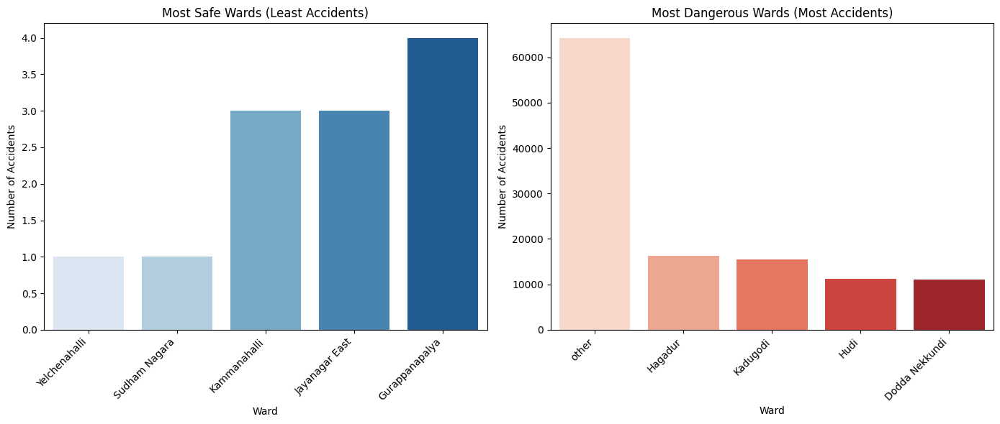

In [ ]:
# Sort the wards in ascending order
most_safe_wards = wardwise_accidents.sort_values(by='Accidents').head(5)

# Sort the wards in descending order
most_dangerous_wards = wardwise_accidents.sort_values(by='Accidents', ascending=False).head(5)

# Create a figure with two subplots side by side
plt.figure(figsize=(14, 6))

# Plot the most safe wards using a bar plot in the first subplot
plt.subplot(1, 2, 1)
sns.barplot(x='Ward', y='Accidents', data=most_safe_wards, palette='Blues')
plt.xlabel('Ward')
plt.ylabel('Number of Accidents')
plt.title('Most Safe Wards (Least Accidents)')
plt.xticks(rotation=45, ha='right')

# Plot the most dangerous wards using a bar plot in the second subplot
plt.subplot(1, 2, 2)
sns.barplot(x='Ward', y='Accidents', data=most_dangerous_wards, palette='Reds')
plt.xlabel('Ward')
plt.ylabel('Number of Accidents')
plt.title('Most Dangerous Wards (Most Accidents)')
plt.xticks(rotation=45, ha='right')

# Adjust layout to prevent overlapping
plt.tight_layout()

# Show the plot
plt.show()

## **Visualizing the values of speed during the time of accident:**

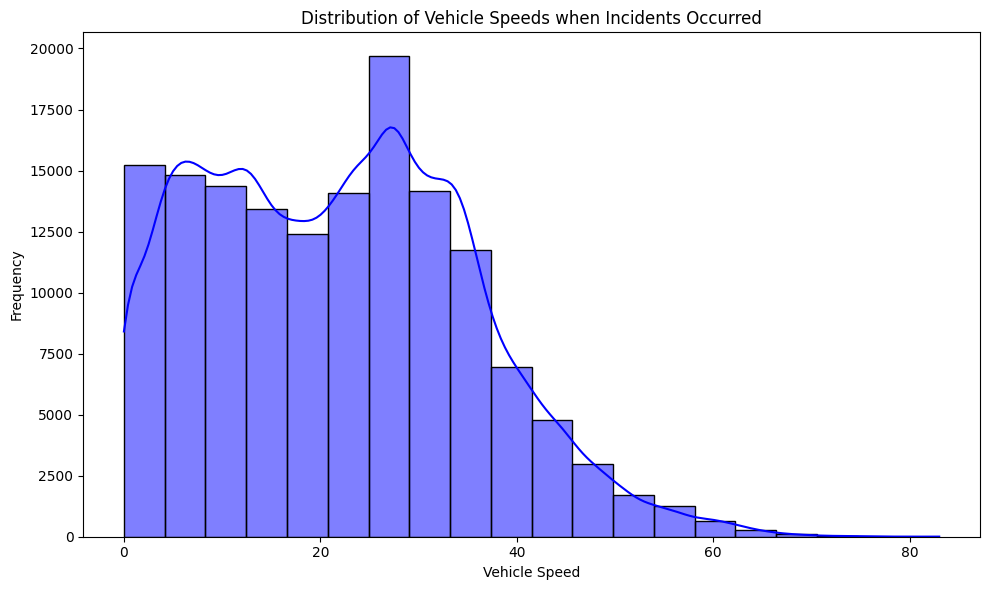

In [ ]:
# Filter relevant columns
speed_data = df[['Pyld_Speed']]

# Remove any invalid speed data (e.g., negative speeds)
speed_data = speed_data[speed_data['Pyld_Speed'] >= 0]

# Plot the distribution of vehicle speeds using a histogram
plt.figure(figsize=(10, 6))
sns.histplot(speed_data['Pyld_Speed'], kde=True, bins=20, color='blue')
plt.xlabel('Vehicle Speed')
plt.ylabel('Frequency')
plt.title('Distribution of Vehicle Speeds when Incidents Occurred')
plt.tight_layout()
plt.show()



### **Observations:**<br>
The highest speed recorded is around 85km/hr. <br>
However,the average is around 20-25km/hr

### **Analyzing distribution according to Months:**



Analyzing the distribution of incidents over time helps identify seasonal patterns, long-term trends, and high-incident periods. It can reveal weekdays vs. weekends differences, impact of interventions, and anomalies in data quality. Such insights enable data-driven decision-making for road safety and resource allocation.

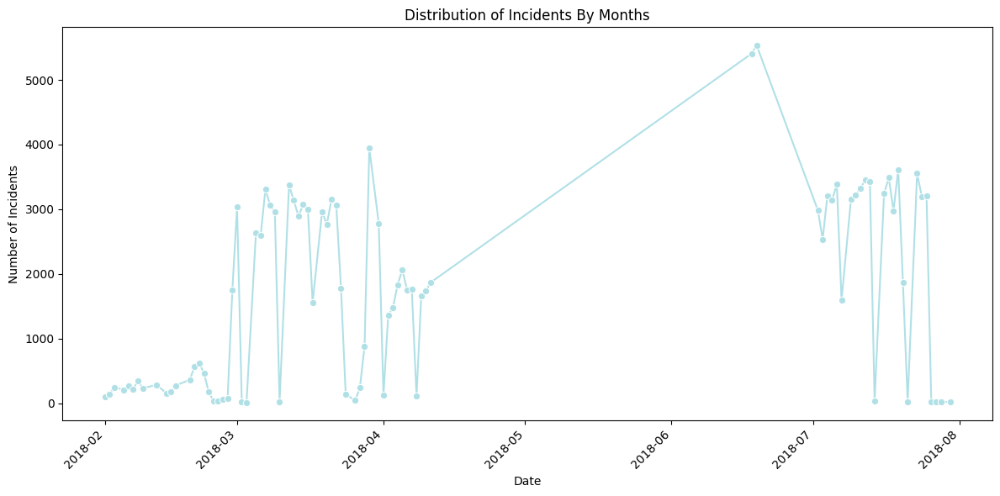

In [ ]:
incident_dates = df[['Date']]

# Group incidents by date and count the number of occurrences
incident_counts = incident_dates['Date'].value_counts().reset_index()
incident_counts.columns = ['Date', 'Incident_Count']

# Sort the incidents by date in ascending order
incident_counts = incident_counts.sort_values(by='Date')

# Plot the distribution of incidents over time using a line plot (Seaborn)
plt.figure(figsize=(12, 6))
sns.lineplot(x='Date', y='Incident_Count', data=incident_counts, marker='o', color='powderblue')
plt.xlabel('Date')
plt.ylabel('Number of Incidents')
plt.title('Distribution of Incidents By Months')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

### **Distribution of Speed for each alarm type**

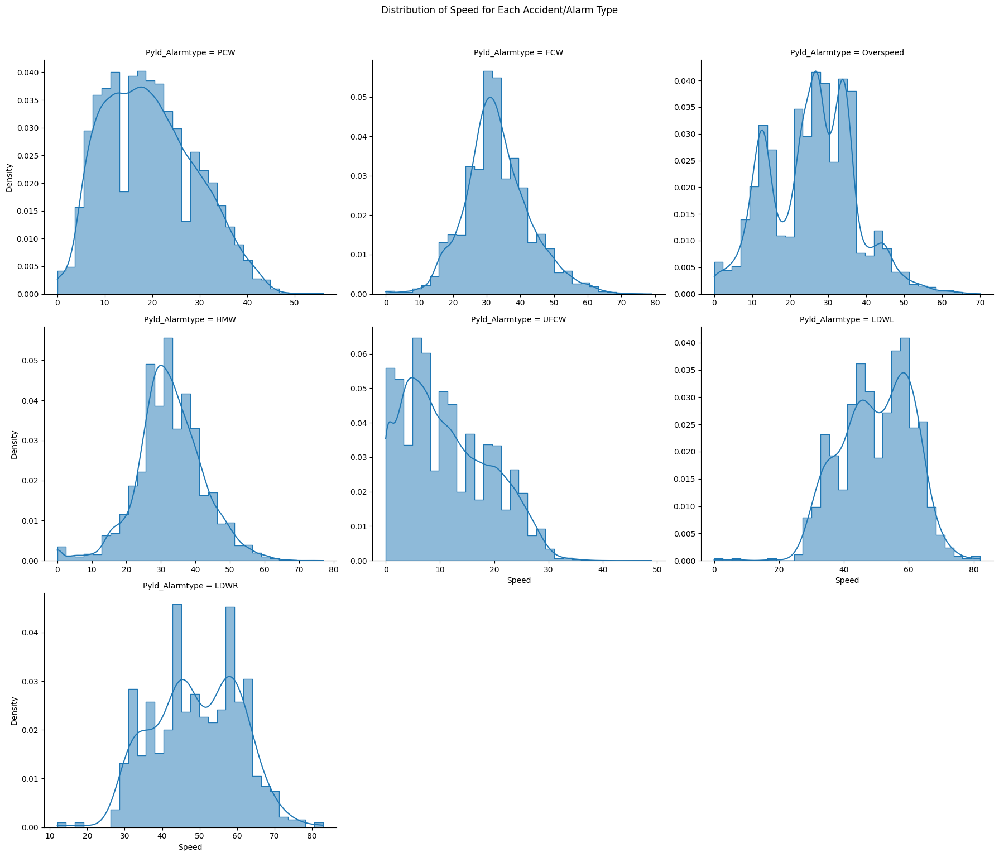

In [ ]:
# Filter relevant columns
speed_data = df[['Pyld_Alarmtype', 'Pyld_Speed']]

# Remove rows with 'Other' as the alarm type (if present)
speed_data = speed_data[speed_data['Pyld_Alarmtype'] != 'Other']

# Create a separate distribution plot for each alarm type
g = sns.FacetGrid(speed_data, col='Pyld_Alarmtype', col_wrap=3, height=5, aspect=1.2, sharex=False, sharey=False)
g.map(sns.histplot, 'Pyld_Speed', bins=30, kde=True, element="step", stat="density")
g.set_axis_labels('Speed', 'Density')
g.fig.suptitle('Distribution of Speed for Each Accident/Alarm Type', y=1.02)
plt.tight_layout()
plt.show()

### **Observations:**
<br>
Low-speed collisions occur at an average speed of 11-12 kmph.<br>
High-speed collisions happen at an average speed of approximately 35 kmph, with numerous instances of even higher speeds.<br>
Overspeeding alarms are reported at an average speed of 25 kmph, which raises doubts about their accuracy and quality.<br>
The average speed for lane departures without indicators, collisions with pedestrians, and collisions with cyclists is 20 kmph.<br>

### **What kind of accidents occur in each area?**

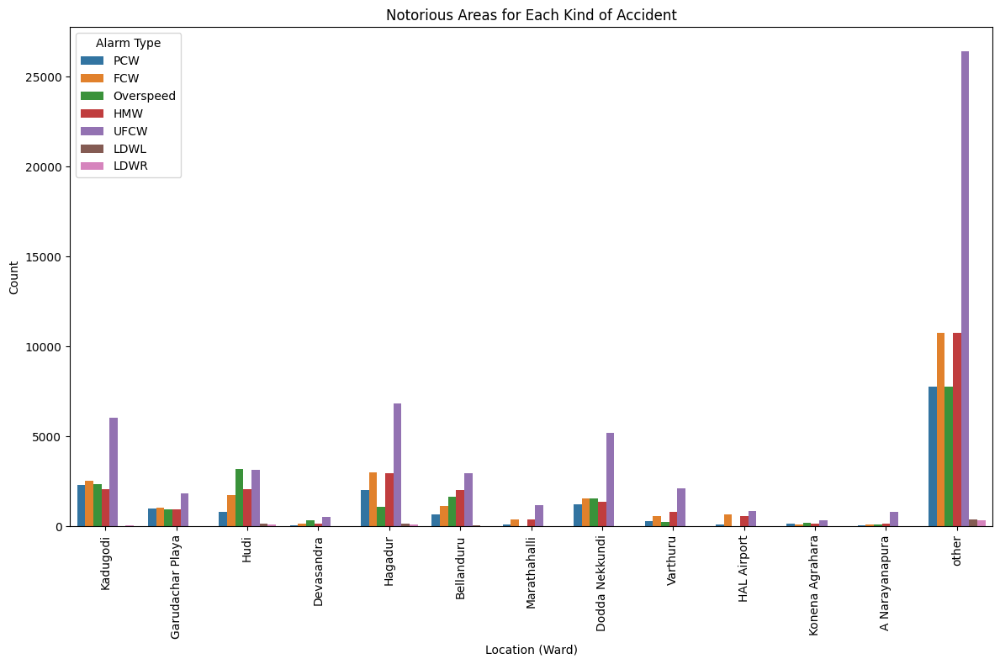

In [ ]:
# Filter relevant columns
accident_data = df[['Location_Wardname', 'Pyld_Alarmtype']]

# Count the occurrences of each ward
ward_counts = accident_data['Location_Wardname'].value_counts()

# Filter wards with more than a certain threshold (e.g., 1000 occurrences)
threshold = 1000
notorious_wards = ward_counts[ward_counts > threshold].index
accident_data = accident_data[accident_data['Location_Wardname'].isin(notorious_wards)]

# Create a bar plot to show notorious areas for each kind of accident
plt.figure(figsize=(12, 8))
sns.countplot(data=accident_data, x='Location_Wardname', hue='Pyld_Alarmtype')
plt.xlabel('Location (Ward)')
plt.ylabel('Count')
plt.title('Notorious Areas for Each Kind of Accident')
plt.xticks(rotation=90)
plt.legend(title='Alarm Type')
plt.tight_layout()
plt.show()

### **Observations:**

1. Hagadur ward has the highest number of incidents for both high and low-speed collisions.
2. Garudachar Playa ward has the highest number of overspeeding incidents.
3. Hagadur ward is notorious not only for collisions with pedestrians and cyclists but also for lane changes without indicators.